In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from scipy import signal as sig
import math
from skimage.util import img_as_ubyte, img_as_float64
from skimage.color import rgb2gray
from skimage.color import rgb2hsv
import matplotlib.pyplot as plt
from skimage.io import imread
import warnings
from PIL import ImageFilter
warnings.filterwarnings('ignore')
import  import_ipynb
import func_expos_fusion as fun
from func_expos_fusion import * 
import WBsRGB as wb_srgb
from functions import *
from uiqm import *
wbModel = wb_srgb.WBsRGB(gamut_mapping=2,
                         upgraded=1)

importing Jupyter notebook from func_expos_fusion.ipynb
importing Jupyter notebook from WBsRGB.ipynb
importing Jupyter notebook from functions.ipynb
importing Jupyter notebook from uiqm.ipynb


# Methodology

In [10]:
def enhance(img):
    '''dehazing of degreded image''' 
    deh = dehaze(img)
    deh = cv2.normalize(deh, None, alpha = 0, beta = 255, norm_type = cv2.NORM_MINMAX, dtype = cv2.CV_32F)
    deh=deh.astype(np.uint8)
    wb = wbModel.correctImage(deh)
    #wb = enhance_contrast(wb)
    
    ''' Color Correction of degreded image'''
    cc = simplest_cb(img,3)
    
    
    '''generating weight maps of dehazed and color corrected image'''
    l = weight_maps(wb,cc)
    
    '''Multi-Scale fusion '''
    fused = fusion(inputs=l[0], weights=l[1], gaussians=l[2])
    
    
    '''contrast enhancement '''
    fused = exposer_fusion(fused)
    return fused

Reading Input images

In [11]:
images = [
    imread('./U45/1.PNG'),imread('./U45/2.PNG'),imread('./U45/3.PNG'),imread('./U45/4.PNG'),imread('./U45/5.PNG'),
    imread('./U45/6.PNG'),imread('./U45/7.PNG'),imread('./U45/8.PNG'),imread('./U45/9.PNG'),imread('./U45/10.PNG'),
    imread('./U45/11.PNG'),imread('./U45/12.PNG'),imread('./U45/13.PNG'),imread('./U45/14.PNG'),imread('./U45/15.PNG'),
    imread('./U45/16.PNG'),imread('./U45/17.PNG'),imread('./U45/18.PNG'),imread('./U45/19.PNG'),imread('./U45/20.PNG'),
    imread('./U45/21.PNG'),imread('./U45/22.PNG'),imread('./U45/23.PNG'),imread('./U45/24.PNG'),imread('./U45/25.PNG'),
    imread('./U45/26.PNG'),imread('./U45/27.PNG'),imread('./U45/28.PNG'),imread('./U45/29.PNG'),imread('./U45/30.PNG'),
    imread('./U45/31.PNG'),imread('./U45/32.PNG'),imread('./U45/33.PNG'),imread('./U45/34.PNG'),imread('./U45/35.PNG'),
    imread('./U45/36.PNG'),imread('./U45/37.PNG'),imread('./U45/38.PNG'),imread('./U45/39.PNG'),imread('./U45/40.PNG'),
    imread('./U45/41.PNG'),imread('./U45/42.PNG'),imread('./U45/43.PNG'),imread('./U45/44.PNG'),imread('./U45/45.PNG')
]

Output Images

uciqe:  0.5692073106765747


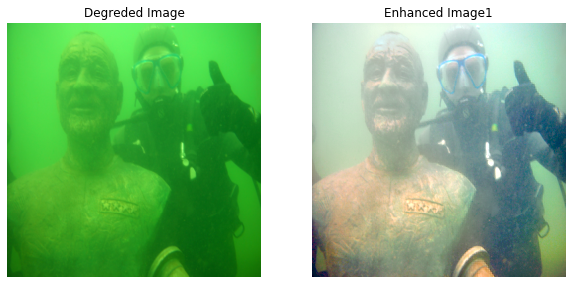

uciqe:  0.5715064406394958


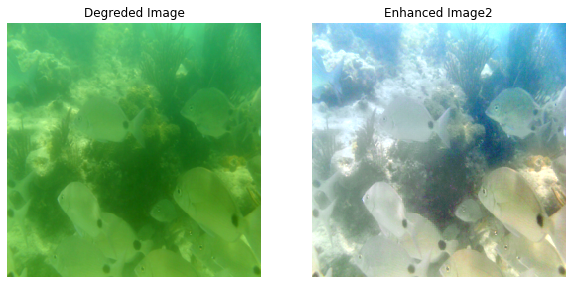

uciqe:  0.6103653311729431


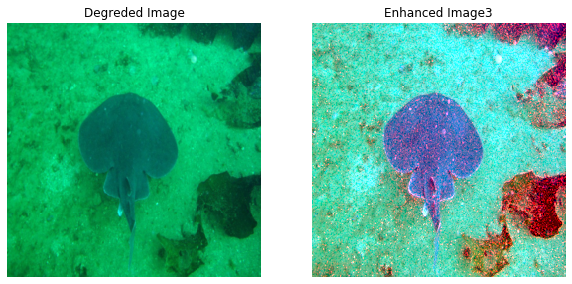

uciqe:  0.577363908290863


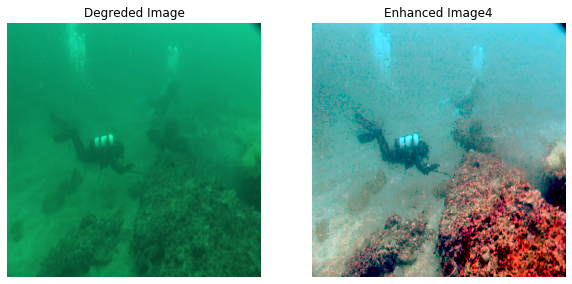

uciqe:  0.588823139667511


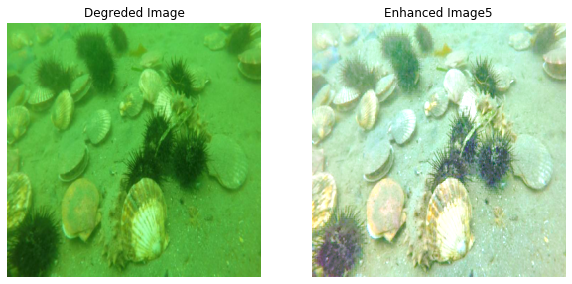

uciqe:  0.5716795921325684


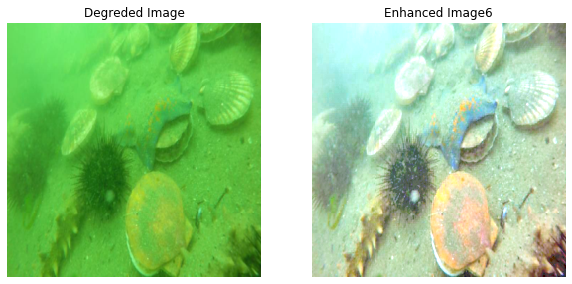

uciqe:  0.6103412508964539


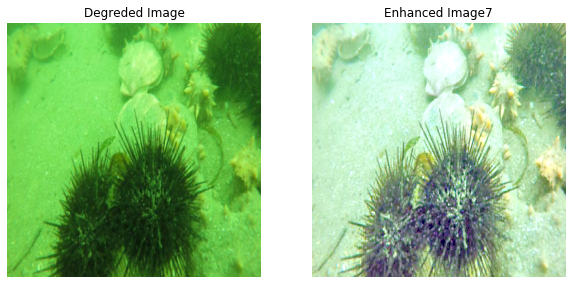

uciqe:  0.5892068147659302


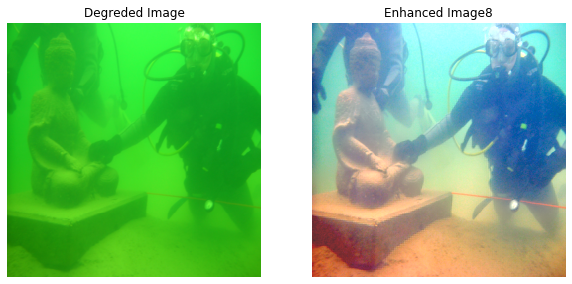

uciqe:  0.621215283870697


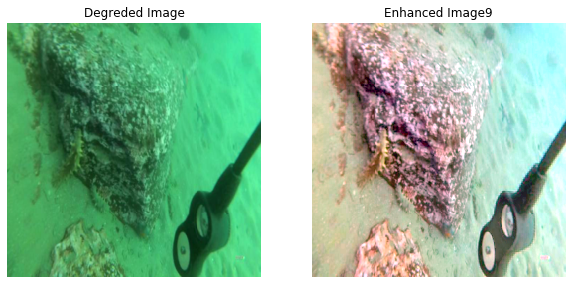

uciqe:  0.5934752821922302


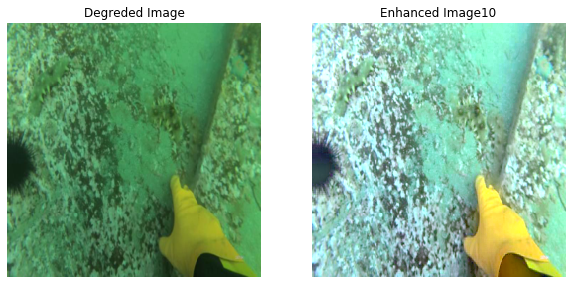

uciqe:  0.5917613506317139


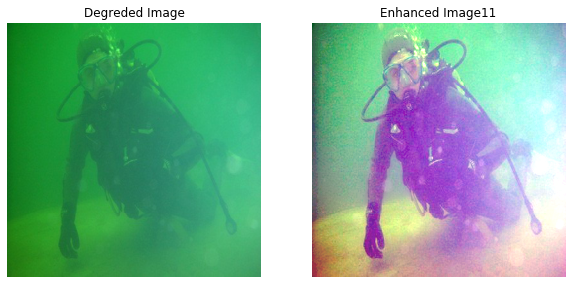

uciqe:  0.5894544720649719


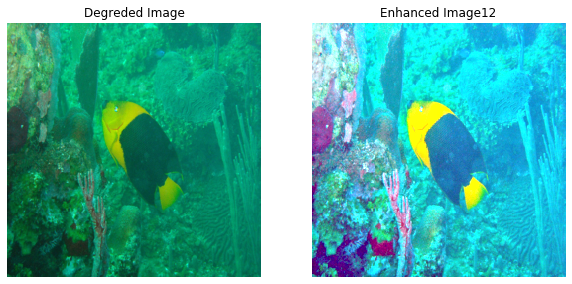

uciqe:  0.6060715913772583


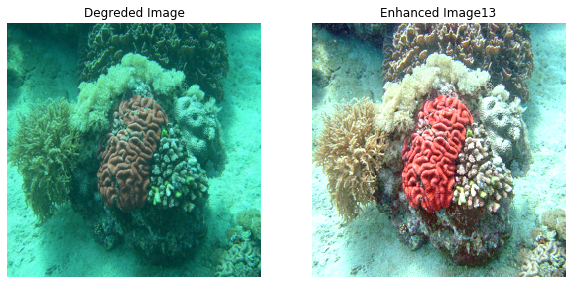

uciqe:  0.6189160346984863


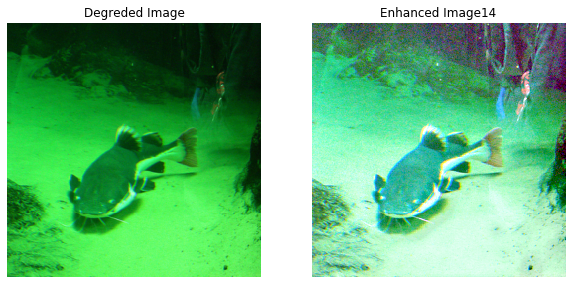

uciqe:  0.6118180155754089


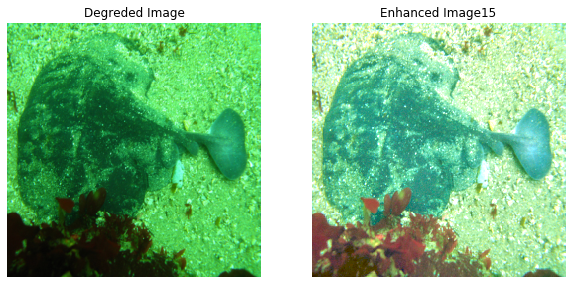

uciqe:  0.5741366147994995


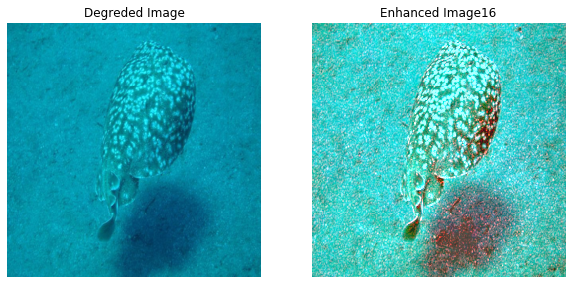

uciqe:  0.6333231329917908


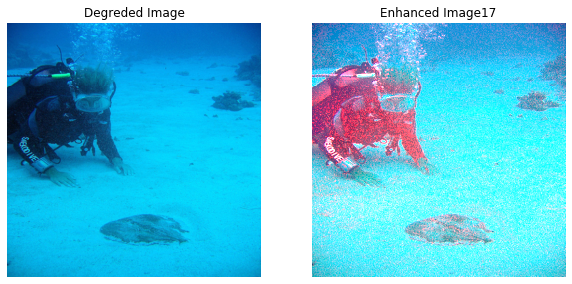

uciqe:  0.6181171536445618


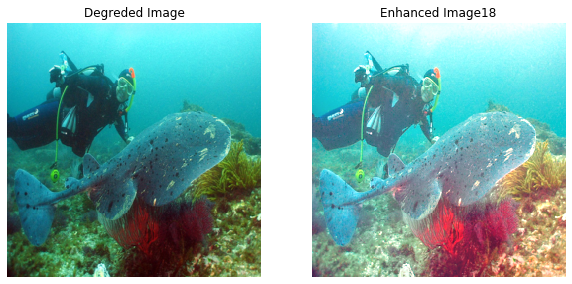

uciqe:  0.6314092874526978


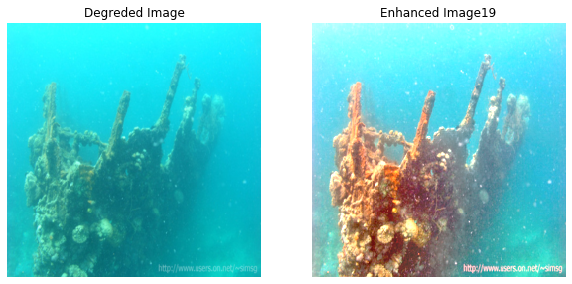

uciqe:  0.5875440835952759


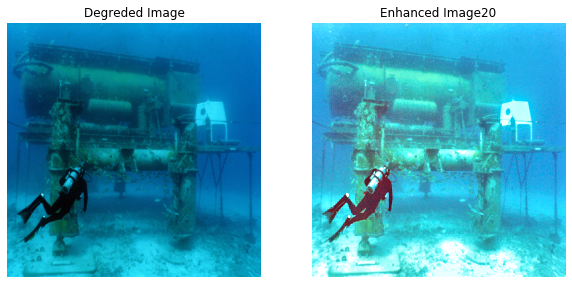

uciqe:  0.0


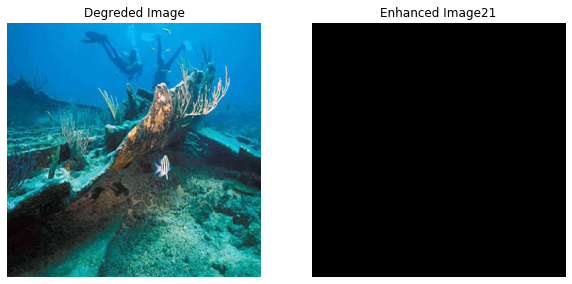

uciqe:  0.5966249108314514


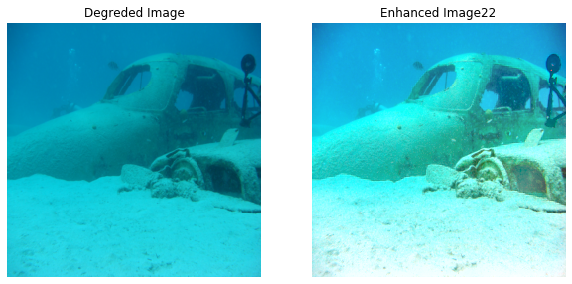

uciqe:  0.59693443775177


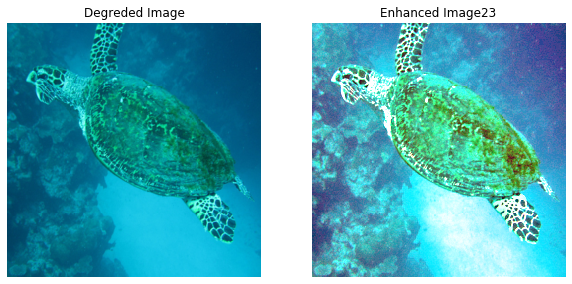

uciqe:  0.6809564828872681


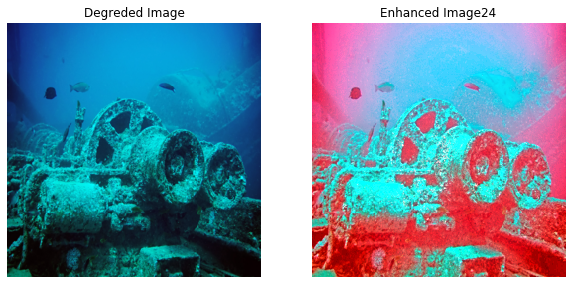

uciqe:  0.6099892854690552


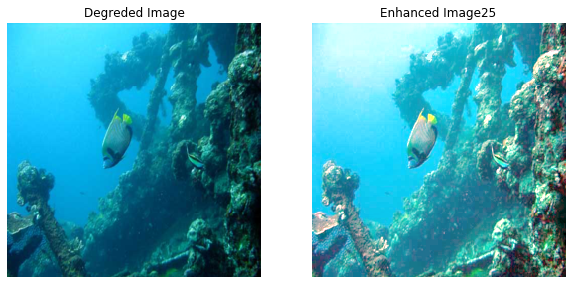

uciqe:  0.5798618793487549


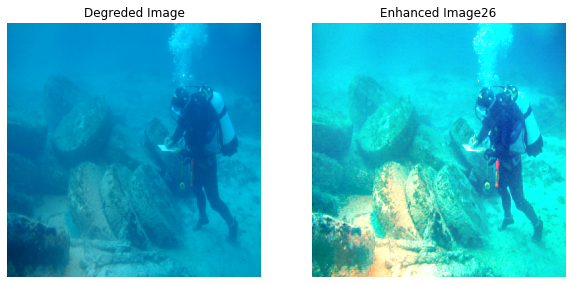

uciqe:  0.6044370532035828


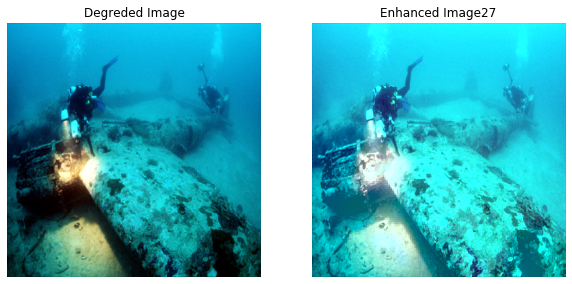

uciqe:  0.5670814514160156


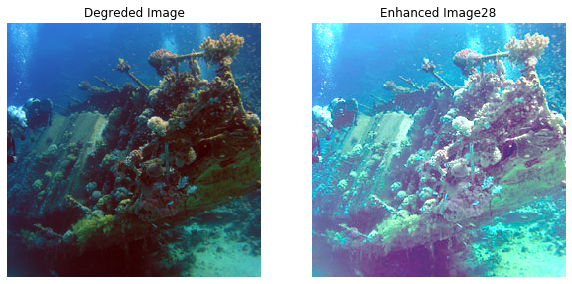

uciqe:  0.6039786338806152


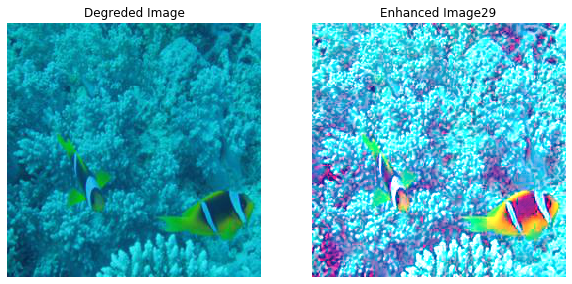

uciqe:  0.5845165252685547


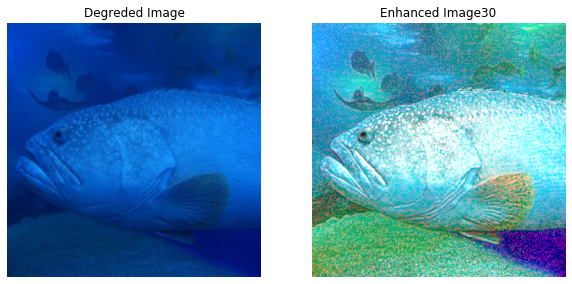

uciqe:  0.5045177340507507


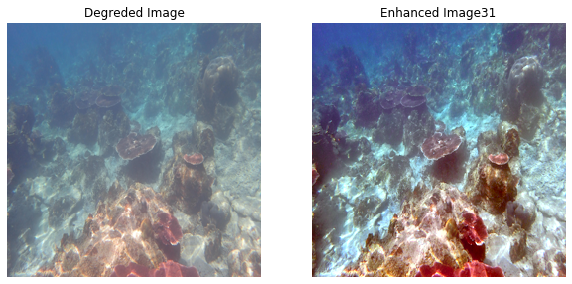

uciqe:  0.547437310218811


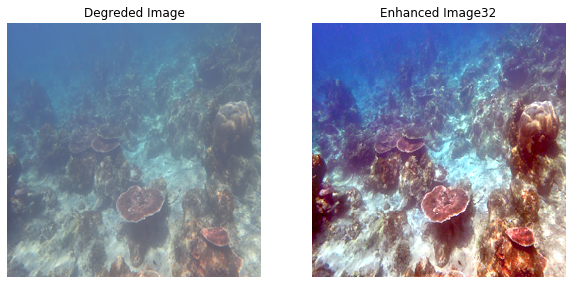

uciqe:  0.5780029296875


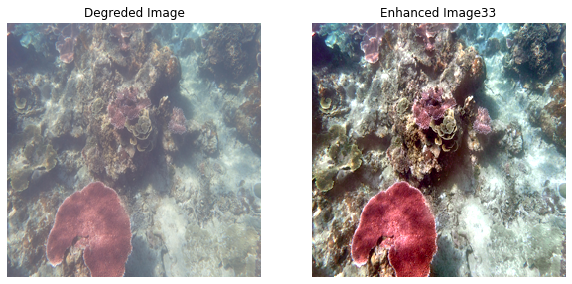

uciqe:  0.5715839862823486


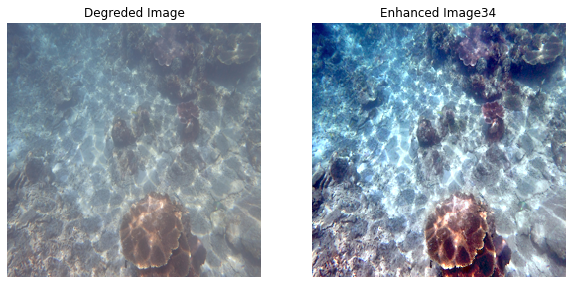

uciqe:  0.5692532658576965


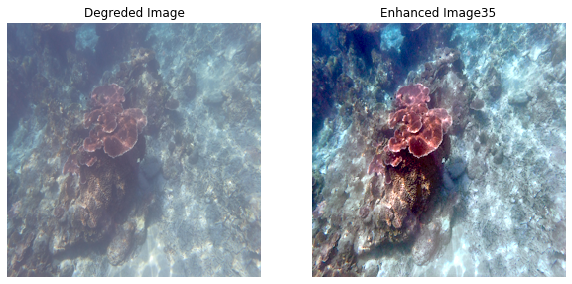

uciqe:  0.5573786497116089


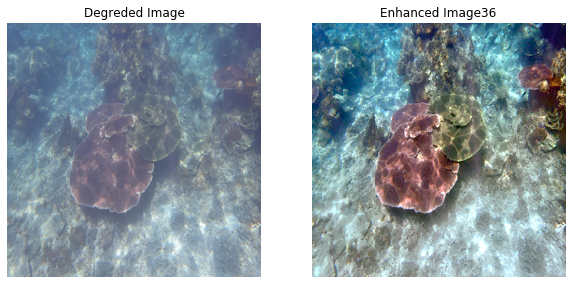

uciqe:  0.5795483589172363


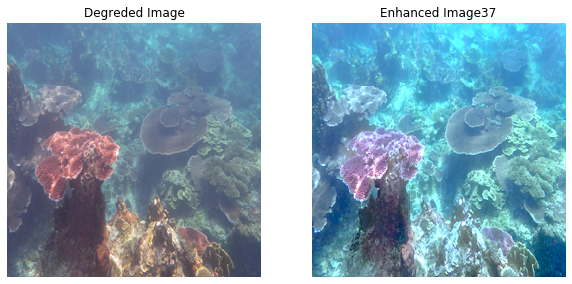

uciqe:  0.5856229066848755


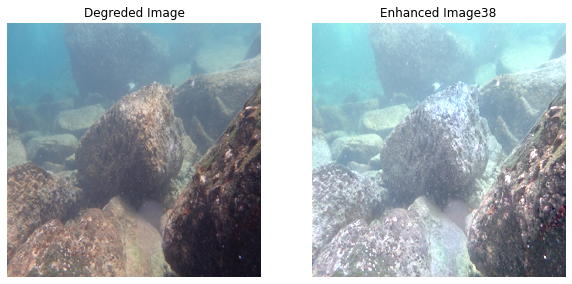

uciqe:  0.5785659551620483


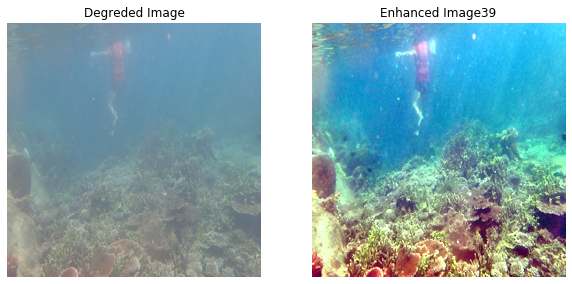

uciqe:  0.5685123205184937


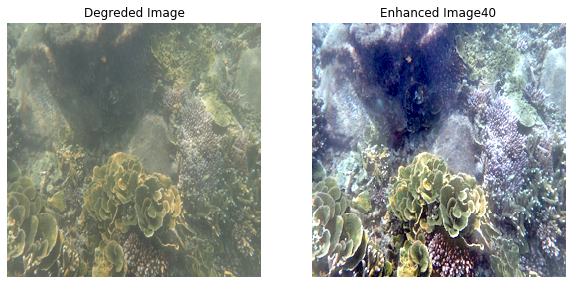

uciqe:  0.5408884882926941


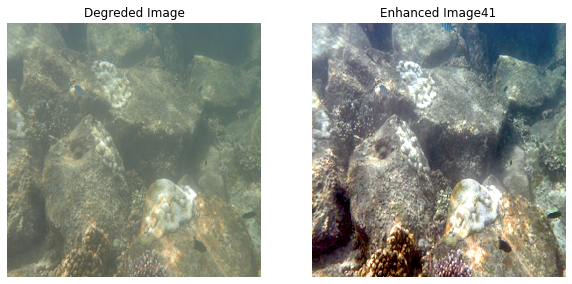

uciqe:  0.5629557371139526


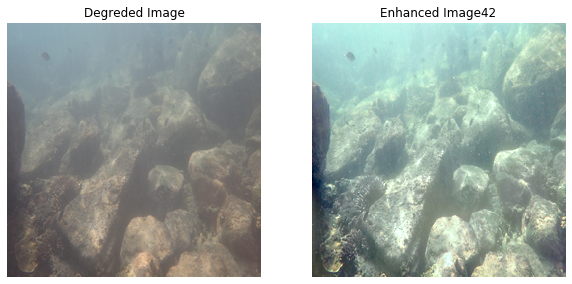

uciqe:  0.5745130181312561


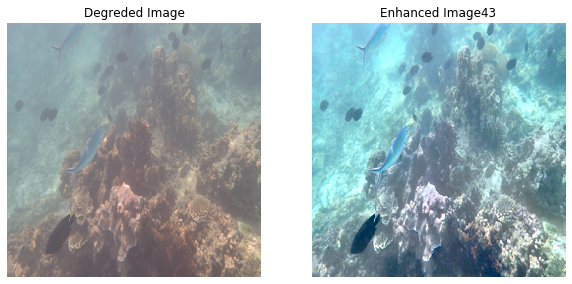

uciqe:  0.5873799920082092


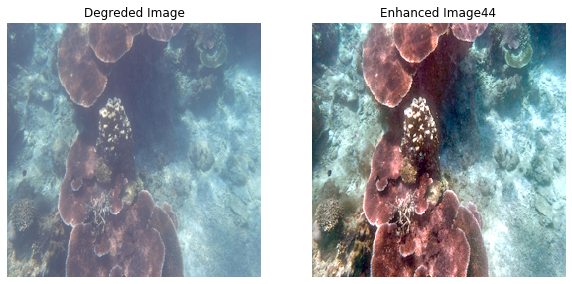

uciqe:  0.5709531903266907


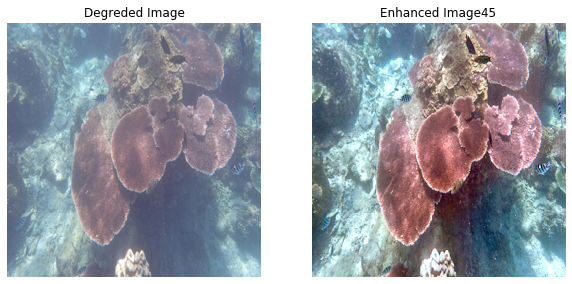

In [12]:
temp=[]
t=[]
plt.rc('figure', figsize=(10, 10))
i=0

for image in images:
    i=i+1
    
    image = cv2.resize(image, (256, 256),  
               interpolation = cv2.INTER_NEAREST)
   
    
    '''call the enhanced algorithm'''
    enhanced_data = enhance(image)
    
    '''contrast enhancement of fused image'''
    
    enhanced_data = fun.exposer_fusion(enhanced_data)
    
    end = time.time()

    
    print("uciqe: ",UCIQE(enhanced_data))
    temp.append(UCIQE(enhanced_data))
    t.append(getUIQM(enhanced_data))
    
    l=[image,enhanced_data]
    plt.figure()

    # Display results
    plt.subplot(1, 2, 1)
    plt.imshow(l[0])
    plt.title('Degreded Image')
    plt.axis('off')
    
    plt.subplot(1, 2, 2)
    plt.imshow(l[1])
    plt.title('Enhanced Image'+str(i))
    plt.axis('off')

    plt.show()

storing output images in output_images folder

In [ ]:
in_dir ='./U45/'
out_dir ='./output_images/'
imgfiles = []
valid_images = (".jpg", ".jpeg", ".png")
for f in os.listdir(in_dir):
    if f.lower().endswith(valid_images):
        imgfiles.append(os.path.join(in_dir, f))
for in_img in imgfiles:
    print("processing image: " + in_img + "\n")
    filename, file_extension = os.path.splitext(in_img)  # get file parts
    I = cv2.imread(in_img)  # read the image
    outImg = enhance(I)
    cv2.imwrite(out_dir + '/' + os.path.basename(filename) + file_extension, outImg )